In [52]:
from collections import defaultdict

import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import minimize
import scipy.linalg.interpolative as sli
from sklearn.neighbors import KNeighborsRegressor
import scipy.stats as stats

# Global variables
N = 100  # Number of different points sampled
pressure_noise_magnitude = 0.01
gen = np.random.default_rng()

# 1. Synthetic data generation

In this section we define some functions to generate synthetic data which resembles the PSAAP problem. We assume that there is an underlying latent function which describes the probability of ignition, and observing ignition is like observing a Bernoulli distributed random variable, with p equal to the latent. We also come up with a simple model which generates sigmoidal pressure traces from the 2D parameter space.

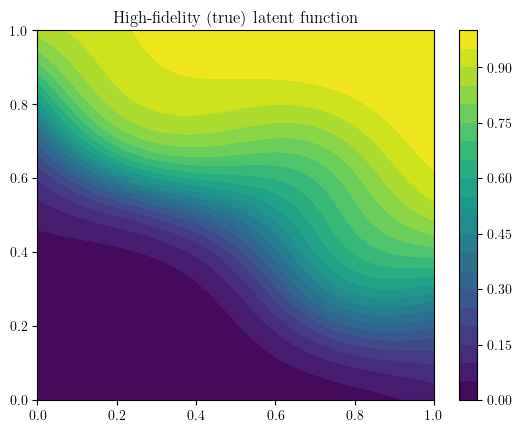

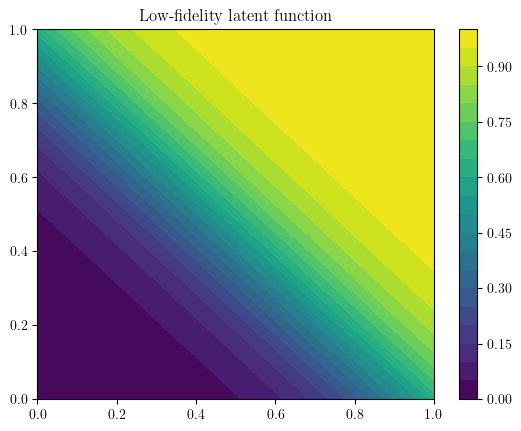

In [2]:

def high_fidelity_latent_function(x):
    assert x.shape[-1] == 2

    # Define a hyperplane with normal vector [1, 1] and offset sqrt(2)
    n_hat = np.array([1, 2]) / np.sqrt(5)
    offset = np.sqrt(2) / 2

    f = np.dot(n_hat, x) - offset

    # Add a sinusoidal perturbation
    f -= 0.1 * np.sin(2 * np.pi * x[0]) * np.sin(2 * np.pi * x[1])
    
    f = 1 / (1 + np.exp(-10 * f))

    return f


def low_fidelity_latent_function(x):
    assert x.shape[-1] == 2

    # Define a hyperplane with normal vector [1, 1] and offset sqrt(2)
    n_hat = np.array([1, 1]) / np.sqrt(2)
    offset = np.sqrt(2) / 2 - 0.05  # Overall, the LF is more likely to ignite, so f is larger

    f = np.dot(n_hat, x) - offset
    
    f = 1 / (1 + np.exp(-10 * f))

    return f


def visualise_latent_functions(f, title):
    # Contour plot of latent
    x = np.linspace(0, 1, 100)
    y = np.linspace(0, 1, 100)
    X, Y = np.meshgrid(x, y)
    Z = np.zeros_like(X)
    for i in range(X.shape[0]):
        for j in range(X.shape[1]):
            Z[i, j] = f(np.array([X[i, j], Y[i, j]]))

    fig = plt.figure()
    ax = fig.add_subplot(111)
    im = ax.contourf(X, Y, Z, 20)

    # Add line at f=0 contour
    ax.contour(X, Y, Z, levels=[0], colors='black')

    fig.colorbar(im)
    ax.set_title(title)
    plt.show()

visualise_latent_functions(high_fidelity_latent_function, 'High-fidelity (true) latent function')
visualise_latent_functions(low_fidelity_latent_function, 'Low-fidelity latent function')


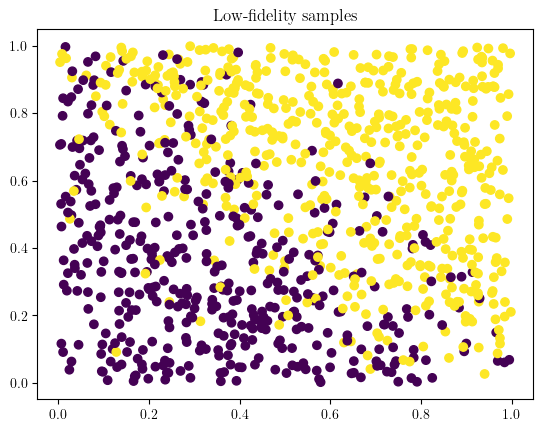

In [3]:
def sample_bernoulli_outcome(x: np.ndarray) -> np.ndarray:
    return np.random.binomial(1, high_fidelity_latent_function(x))

def sample_bernoulli_outcome_low_fidelity() -> np.ndarray:
    xs = np.random.uniform(0, 1, size=(1000, 2))
    outcomes = []
    
    for x in xs:
        outcomes.append(np.random.binomial(1, low_fidelity_latent_function(x)))
        
    return xs, outcomes

xs, outcomes = sample_bernoulli_outcome_low_fidelity()

# Plot the samples
fig = plt.figure()
ax = fig.add_subplot(111)
ax.scatter(xs[:, 0], xs[:, 1], c=outcomes, cmap='viridis')
ax.set_title('Low-fidelity samples')
plt.show()


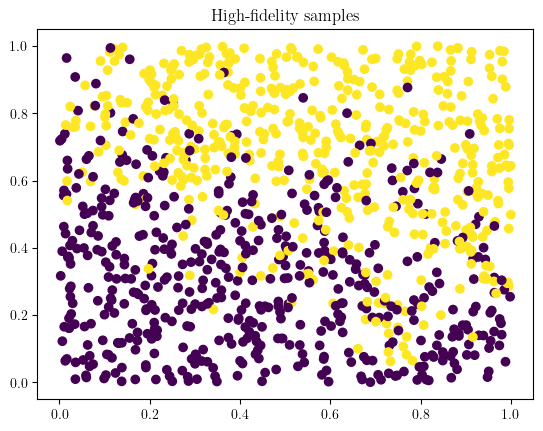

In [4]:
# The same as above but for high fidelity

def sample_bernoulli_outcome_high_fidelity() -> np.ndarray:
    xs = np.random.uniform(0, 1, size=(1000, 2))
    outcomes = []
    
    for x in xs:
        outcomes.append(np.random.binomial(1, high_fidelity_latent_function(x)))
        
    return xs, outcomes

xs, outcomes = sample_bernoulli_outcome_high_fidelity()

# Plot the samples
fig = plt.figure()
ax = fig.add_subplot(111)
ax.scatter(xs[:, 0], xs[:, 1], c=outcomes, cmap='viridis')
ax.set_title('High-fidelity samples')
plt.show()

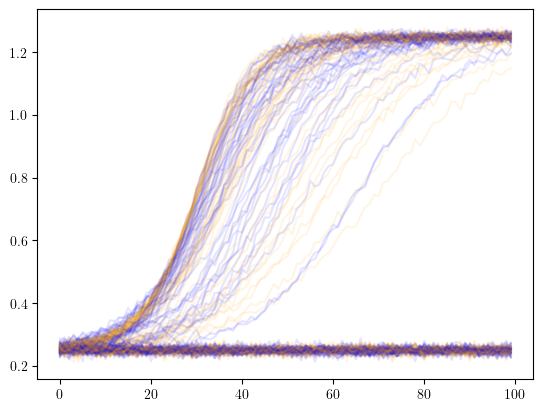

In [10]:
# We also need to be able to synthesize pressure traces

def sigmoid(t, t0, k):
    return 1 / (1 + np.exp(- k * (t - t0)) ) + 0.25 

def synthesize_hf_pressure_trace(ignition: bool, x: np.ndarray, latent_val: float):
    time_points = np.linspace(0, 1, 100)
    if not ignition:
        return pressure_noise_magnitude * np.random.randn(100) + 0.25 # Flat line
    else:
        # Sigmoidal rise, varying the slope and the delay time
        n_hat = np.array([1, 1])
        plane_val = 10.0 * np.dot(n_hat, x)
        return sigmoid(time_points, 0.8 - 0.5 * latent_val, plane_val) + pressure_noise_magnitude * np.random.randn(100)

def synthesize_lf_pressure_trace(ignition: bool, x: np.ndarray, latent_val: float):
    time_points = np.linspace(0, 1, 100)
    if not ignition:
        return pressure_noise_magnitude * np.random.randn(100) + 0.25 # Flat line
    else:
        # Sigmoidal rise, varying the slope and the delay time
        n_hat = np.array([1, 1])
        plane_val = 10.0 * np.dot(n_hat, x)
        return sigmoid(time_points, 0.8 - 0.5 * latent_val, plane_val) + pressure_noise_magnitude * np.random.randn(100)


def synthesize_hf_outcomes_and_pressures(xs, hf_latents):
    hf_outcomes = [np.random.binomial(1, f) for f in hf_latents]
    hf_pressure_traces = np.array([synthesize_hf_pressure_trace(ignition, x, f) for ignition, x, f in zip(hf_outcomes, xs, hf_latents)])
    return hf_outcomes, hf_pressure_traces


def synthesize_lf_outcomes_and_pressures(xs, lf_latents):
    lf_outcomes = [np.random.binomial(1, f) for f in lf_latents]
    lf_pressure_traces = np.array([synthesize_lf_pressure_trace(ignition, x, f) for ignition, x, f in zip(lf_outcomes, xs, lf_latents)])
    return lf_outcomes, lf_pressure_traces


xs = np.random.uniform(0, 1, size=(N, 2))
hf_latents = [high_fidelity_latent_function(x) for x in xs]
lf_latents = [low_fidelity_latent_function(x) for x in xs]
hf_outcomes, hf_pressure_traces = synthesize_hf_outcomes_and_pressures(xs, hf_latents)
lf_outcomes, lf_pressure_traces = synthesize_lf_outcomes_and_pressures(xs, lf_latents)


# Visualise all pressure traces
fig = plt.figure()
ax = fig.add_subplot(111)
for i in range(len(lf_pressure_traces)):
    ax.plot(hf_pressure_traces[i, :], c='blue', alpha=0.1)
    ax.plot(lf_pressure_traces[i, :], c='orange', alpha=0.1)
plt.show()

# 2. Conditional surrogate model of LF

We need a surrogate model for the LF pressure traces, conditional on successful ignition. A simple and reasonable choice is k-NN regression.

In [12]:
model_lf_ignition = KNeighborsRegressor(n_neighbors=1)

ignition_mask = np.array(lf_outcomes) == 1
X = xs[ignition_mask]
y = lf_pressure_traces[ignition_mask]

model_lf_ignition.fit(X, y)

KNeighborsRegressor(n_neighbors=1)

# 3. Evaluate standard ID using a fixed basis set

Next up, we want to evaluate the performance of standard ID using a fixed basis set. The evaluation is performed by repeatedly sampling a LF and a HF dataset, computing the ID weights using the LF dataset, then reconstructing the non-basis HF pressure traces using the HF basis plus the ID weights, and then calculating the error between the true vs. reconstructed HF pressure traces. This process is repeated until the average error stabilises. Note that the choice of basis coordinates is fixed at the beginning- we are sampling pressure traces from fixed coordinates by sampling from a Bernoulli distribution to determine ignition.

In [21]:
# Choose interpolation weights using ID

A = lf_pressure_traces.T  # (100, N)

k, idx, proj = sli.interp_decomp(A, 0.05)  # idx is a column index array

print(k, proj.shape)

B = A[:, idx[:k]]  # Skeleton matrix (100, 4)
C = A[:, idx[k:]]  # Non - skeleton matrix (100, 996)

approx_C = np.matmul(B, proj)

assert np.mean(C - approx_C) < 1e-2
assert k == 4

4 (4, 96)


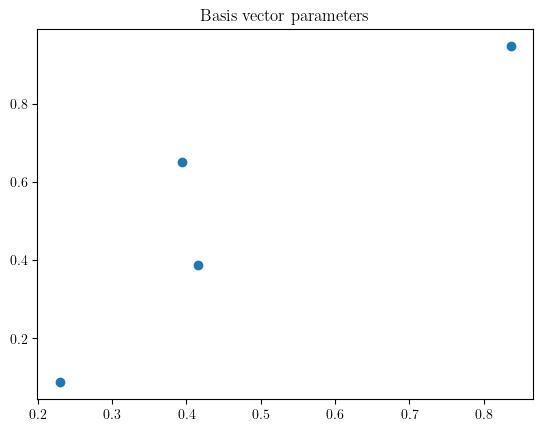

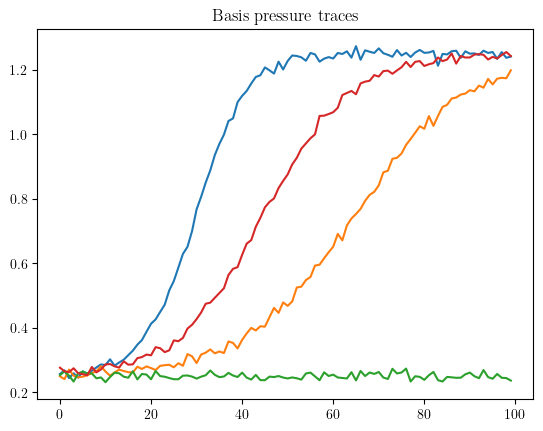

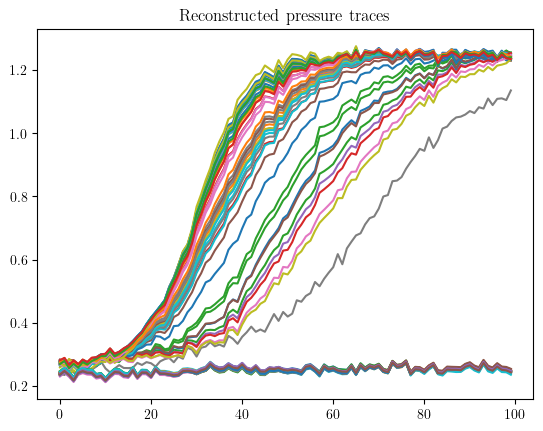

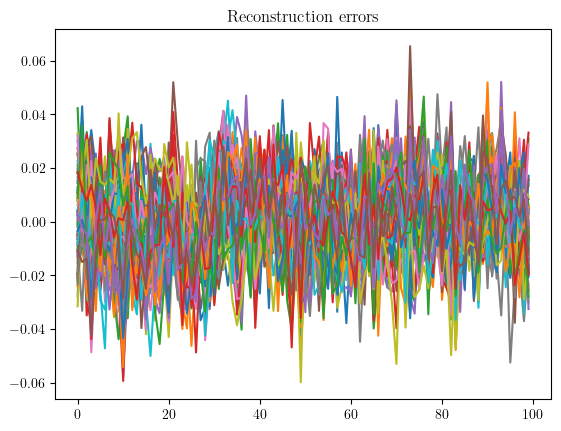

In [22]:
# Show position of basis in param space and reconstruction of LF dataset

basis_xs = xs[idx[:k], :]
non_basis_xs = xs[idx[k:], :]

plt.scatter(basis_xs[:, 0], basis_xs[:, 1])
#plt.scatter(non_basis_xs[:, 0], non_basis_xs[:, 1])
#plt.xlim(0, 1)
#plt.ylim(0, 1)
plt.title('Basis vector parameters')
plt.show()

plt.title('Basis pressure traces')
plt.plot(B)
plt.show()

plt.title('Reconstructed pressure traces')
plt.plot(approx_C)
plt.show()

plt.title('Reconstruction errors')
plt.plot(approx_C - C)
plt.show()

In [67]:
# Define least squares problem for calculating a particular set of interpolation weights, given: 
# - data matrix of basis pressure traces B
# - non-basis traces C

def calculate_interpolation_weights(B, C):
    assert B.shape == (100, k)
    assert C.shape == (100, N - k)
    proj_shape = (k, N - k)
    
    def objective_fn(p):
        p = p.reshape(proj_shape)
        f = 0.5 * np.sum((B.dot(p) - C)**2)
        return f
    
    def gradient_fn(p):
        p = p.reshape(proj_shape)
        return B.T.dot(B.dot(p) - C).flatten()

    x0 = np.random.rand(np.prod(proj_shape))
    res = minimize(objective_fn, x0, jac=gradient_fn, method='BFGS', options={'disp': False, 'maxiter': 50})

    assert res.success
    proj_min = res.x

    return proj_min


# Sample the HF non-basis reconstruction error

def sample_hf_reconstruction_error_standardID():
    _, hf_pressure_traces = synthesize_hf_outcomes_and_pressures(xs, hf_latents)
    _, lf_pressure_traces = synthesize_lf_outcomes_and_pressures(xs, lf_latents)  # We don't care about the sampled outcomes at this point

    A_lf = lf_pressure_traces.T  # (100, N)
    B_lf = A_lf[:, idx[:k]]  # Skeleton matrix (100, 4)
    C_lf = A_lf[:, idx[k:]]  # Non - skeleton matrix (100, N - 4)
    proj = calculate_interpolation_weights(B_lf, C_lf)
    proj = proj.reshape(k, N - k)

    A_hf = hf_pressure_traces.T
    B_hf = A_hf[:, idx[:k]]
    C_hf = A_hf[:, idx[k:]]

    C_recon = np.matmul(B_hf, proj)

    # Return the average L2 error norm of each reconstruction
    C_err = C_recon - C_hf
    all_err_norms = np.linalg.norm(C_err, axis=0)
    assert all_err_norms.shape == (N - k,)

    return np.mean(all_err_norms)

In [78]:
# Repeatedly sample reconstruction errors for standard ID (with fixed basis)

def measure_errors(error_sample_fn, num_samples = 50):
    errors = []

    i = 0
    
    while i < num_samples:
        errors.append(error_sample_fn())
        i += 1

    return errors


errors_standard = measure_errors(sample_hf_reconstruction_error_standardID, 250)

# 4. Store weights for all possible basis fates

This is the offline step. For each possible set of basis ignition fates (there are 2^num_basis possibilities), sample the LF data, then compute and store the projection matrix.

In [94]:
def sample_conditional_lf_pressure_trace_proj(ignition_fates):
    assert len(ignition_fates) == k

    _, lf_pressure_traces = synthesize_lf_outcomes_and_pressures(xs, lf_latents)
    A = lf_pressure_traces.T

    # First sample the non-basis pressure traces, and throw away the basis pressure traces since they are unconditional on ignition fate
    # This is fine, because the pressure trace at each x is independent of each other
    C = A[:, idx[k:]]  # (100, N - k)

    basis_lf_latents = [low_fidelity_latent_function(x) for x in basis_xs]

    assert len(basis_xs) == len(ignition_fates)
    assert len(basis_lf_latents) == len(basis_xs)

    # Next, sample the basis pressure traces for the given ignition fates
    basis_lf_pressure_trace_samples = [synthesize_lf_pressure_trace(ignition, x, f) for ignition, x, f in zip(ignition_fates, basis_xs, basis_lf_latents)]
    B = np.array(basis_lf_pressure_trace_samples).T  # (100, k)

    assert B.shape == (100, k)
    assert C.shape == (100, N - k)

    proj = calculate_interpolation_weights(B, C)

    return proj

    
def get_ignition_fates(k):
    from itertools import chain, combinations

    def powerset(iterable):
        s = list(iterable)
        return chain.from_iterable(combinations(s, r) for r in range(len(s)+1))

    inds = list(powerset(range(k)))

    all_fates = []

    for ind in inds:
        fate = np.zeros(shape=(k,), dtype=bool)
        fate[list(ind)] = True
        all_fates.append(tuple(fate))

    assert len(all_fates) == 2**k

    return all_fates

all_fates = get_ignition_fates(k)
fate_to_projs = defaultdict(list)

n_samples_per_fate = 500

for fate in all_fates:
    print(fate)
        
    for _ in range(n_samples_per_fate):
        fate_to_projs[fate].append(sample_conditional_lf_pressure_trace_proj(fate))

(False, False, False, False)
(True, False, False, False)
(False, True, False, False)
(False, False, True, False)
(False, False, False, True)
(True, True, False, False)
(True, False, True, False)
(True, False, False, True)
(False, True, True, False)
(False, True, False, True)
(False, False, True, True)
(True, True, True, False)
(True, True, False, True)
(True, False, True, True)
(False, True, True, True)
(True, True, True, True)


In [95]:
# TODO: Verify this calculation

# 5. Assess conditional ID error

In this case, we want to repeatedly sample HF data matrices, and then reconstruct them using weights which are conditioned on the fate of the basis vectors.

We randomly choose a weight matrix from the empirically-computed distribution.

In [96]:
def sample_hf_reconstruction_error_probID():
    hf_outcomes, hf_pressure_traces = synthesize_hf_outcomes_and_pressures(xs, hf_latents)
    #lf_outcomes, lf_pressure_traces = synthesize_lf_outcomes_and_pressures(xs, lf_latents)

    basis_fates = tuple(np.array(hf_outcomes).astype(bool)[idx[:k]])

    # print(basis_fates)

    projs = fate_to_projs[basis_fates]

    proj = projs[np.random.choice(len(projs))]  # Randomly choose a proj matrix given ignition conditioning
    proj = proj.reshape(k, N - k)

    A_hf = hf_pressure_traces.T
    B_hf = A_hf[:, idx[:k]]  # (100, 4)
    C_hf = A_hf[:, idx[k:]]

    C_recon = np.matmul(B_hf, proj)

    # Return the average L2 error norm of each reconstruction
    C_err = C_recon - C_hf
    all_err_norms = np.linalg.norm(C_err, axis=0)
    assert all_err_norms.shape == (N - k,)

    return np.mean(all_err_norms)

errors_prob = measure_errors(sample_hf_reconstruction_error_probID, 250)

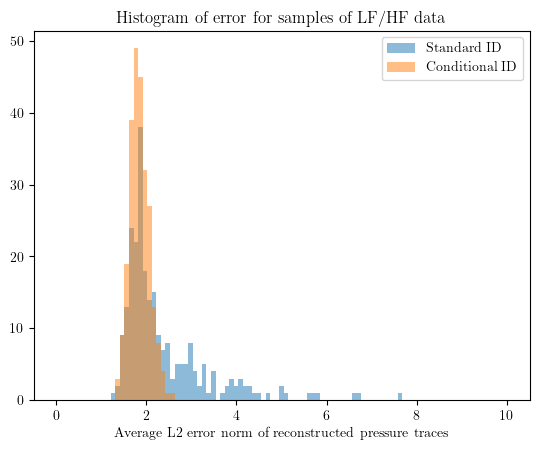

In [97]:

fig, ax = plt.subplots(1, 1)
ax.hist(errors_standard, bins=np.linspace(0, 10, 100), label="Standard ID", alpha=0.5)
ax.hist(errors_prob, bins=np.linspace(0, 10, 100), label="Conditional ID", alpha=0.5)
ax.legend()
ax.set_xlabel("Average L2 error norm of reconstructed pressure traces")
ax.set_title('Histogram of error for samples of LF/HF data')

plt.show()

# 6. Test if the random proj matrices can be modelled as MVN

(False, False, False, False)


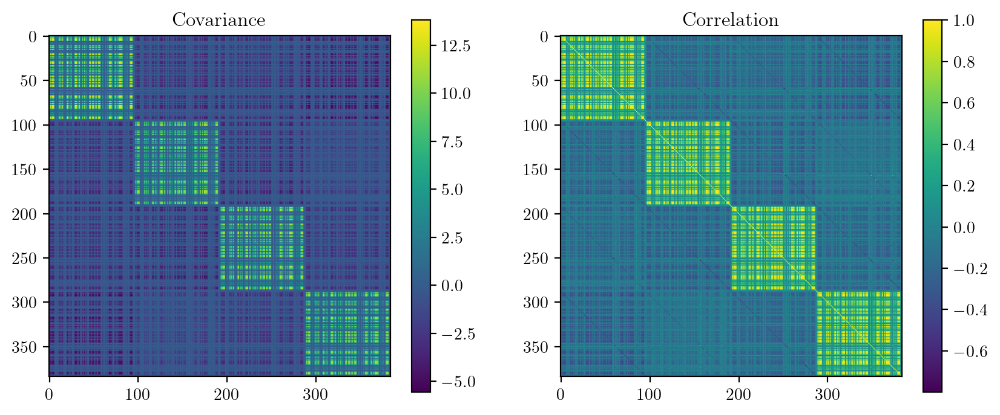

True


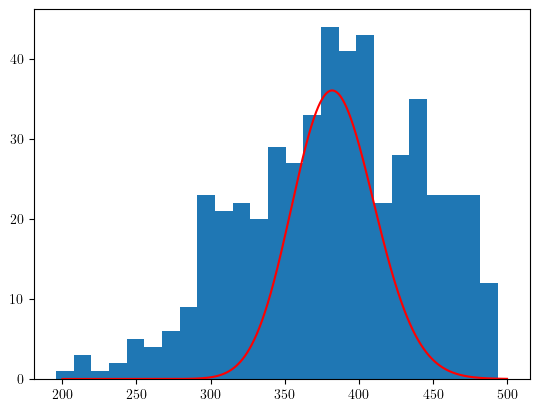

(True, False, False, False)


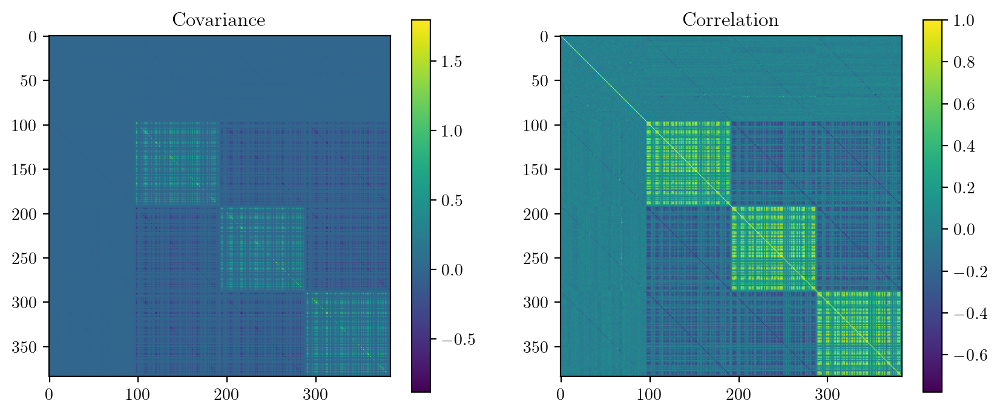

True


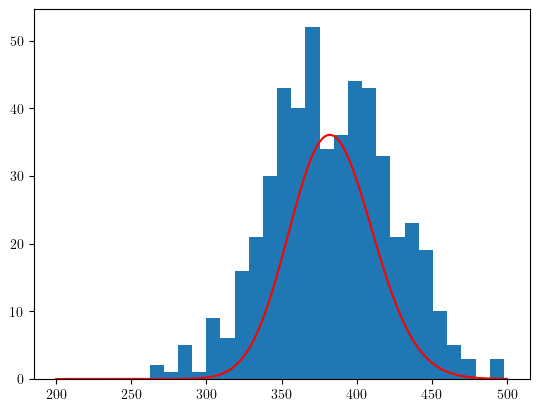

(False, True, False, False)


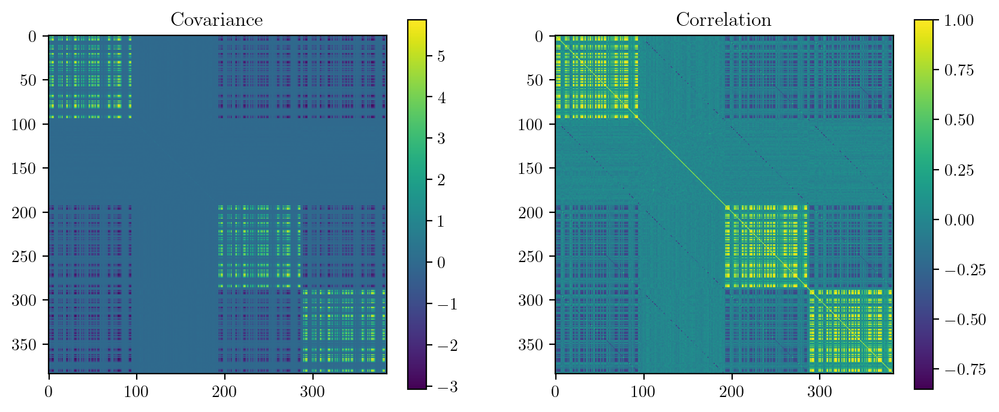

True


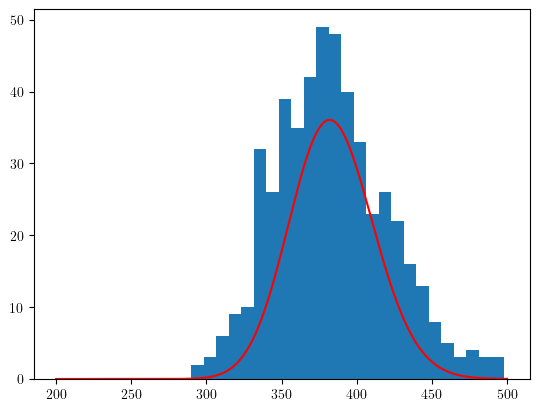

(False, False, True, False)


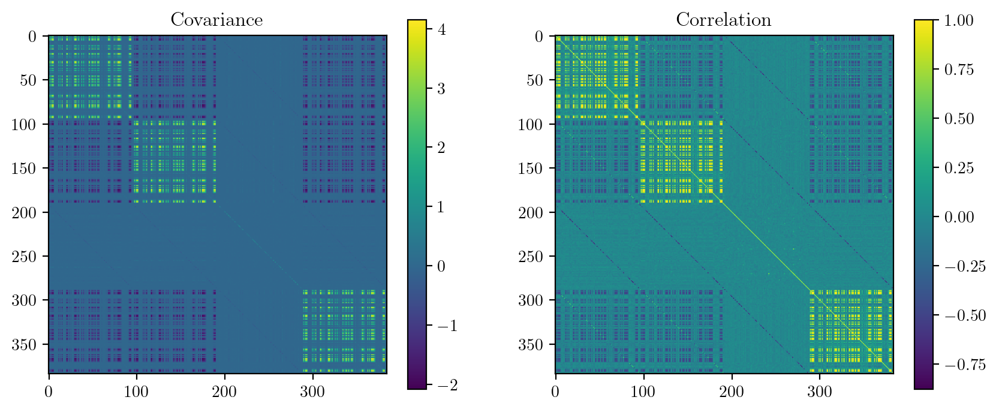

True


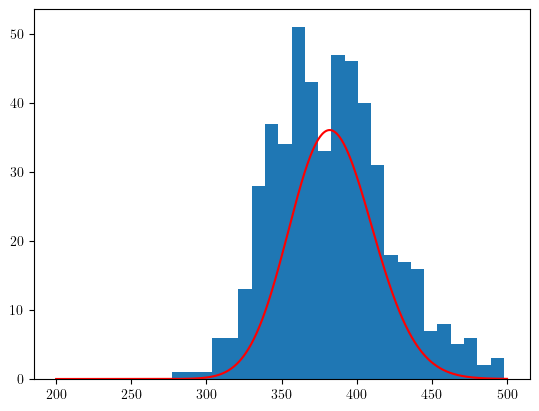

(False, False, False, True)


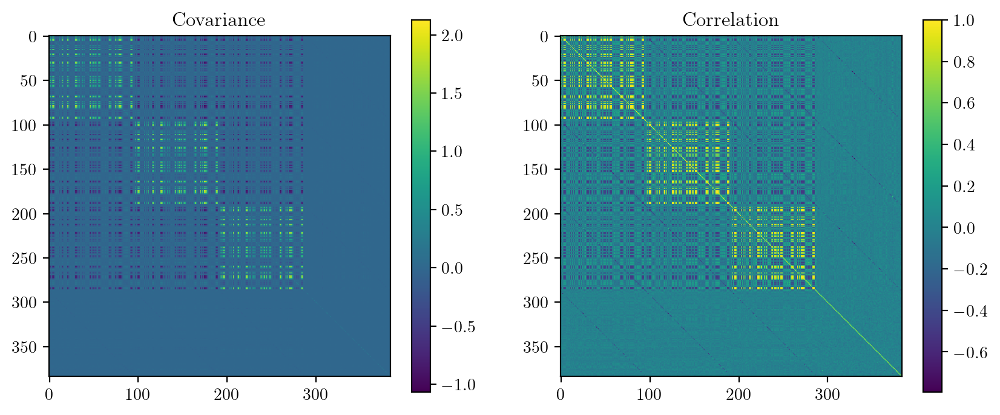

True


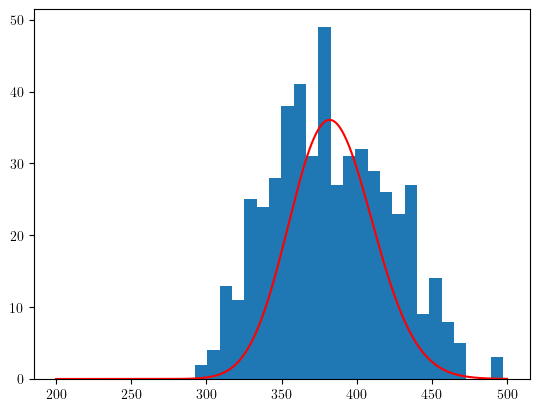

(True, True, False, False)


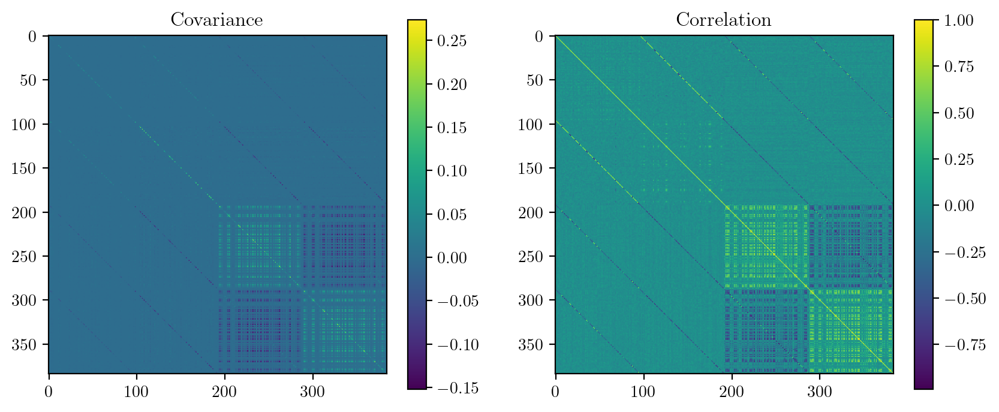

True


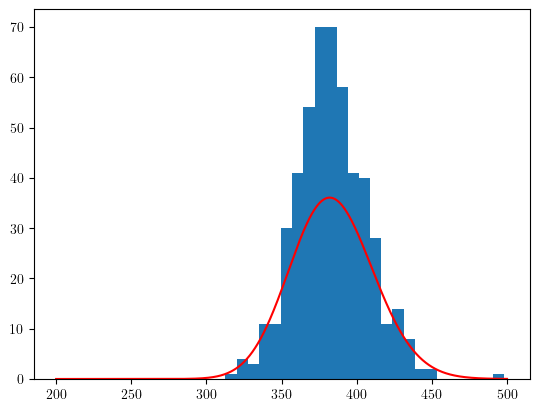

(True, False, True, False)


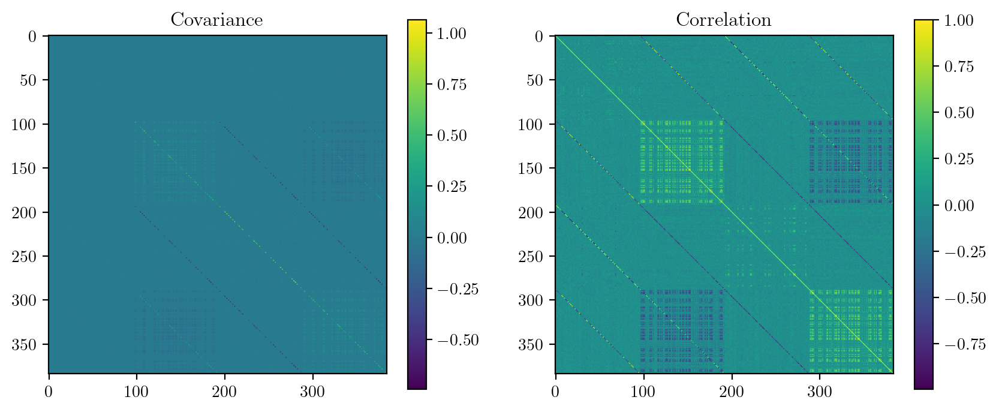

True


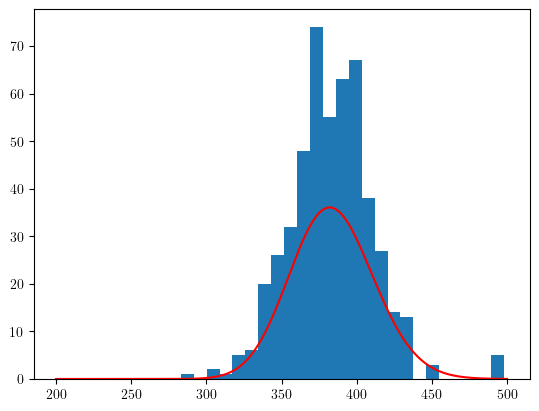

(True, False, False, True)


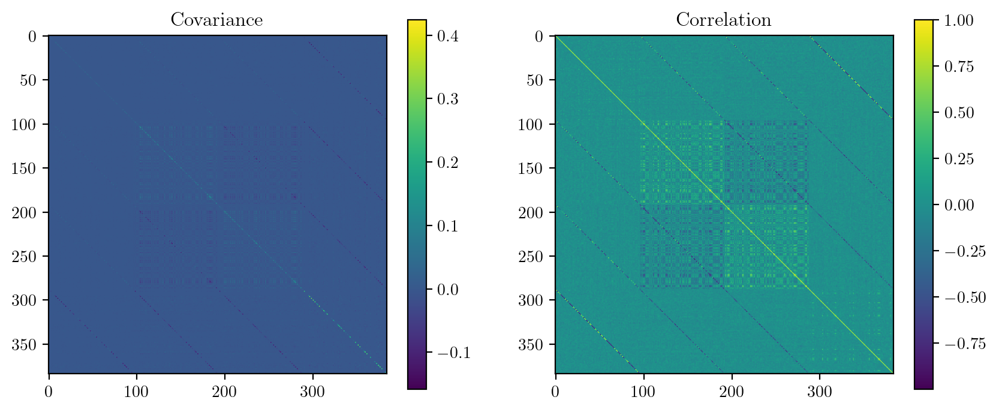

True


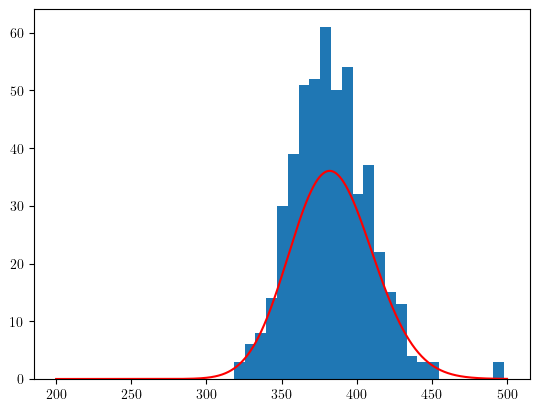

(False, True, True, False)


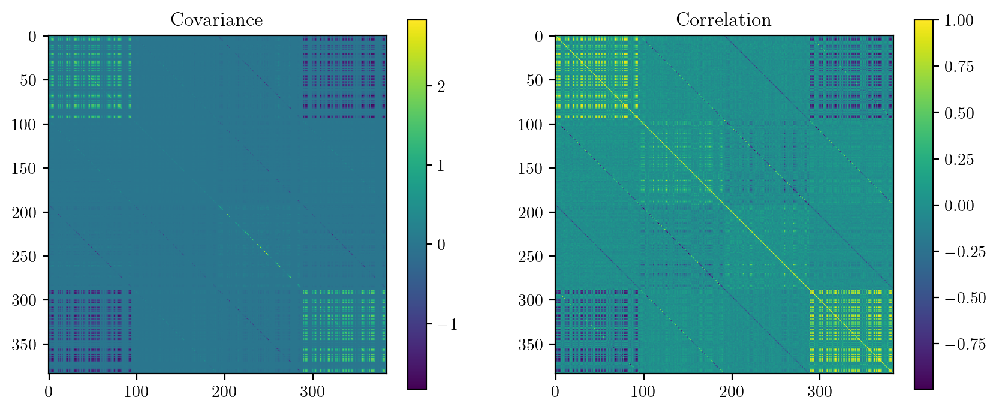

True


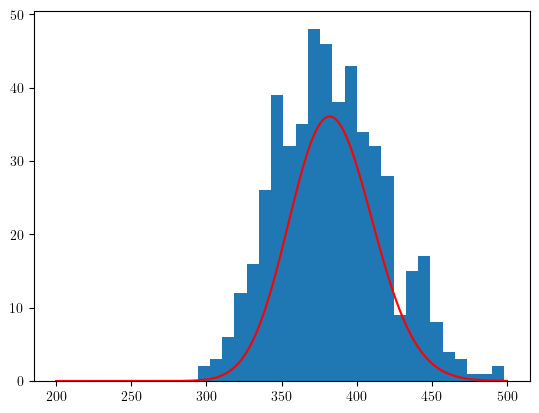

(False, True, False, True)


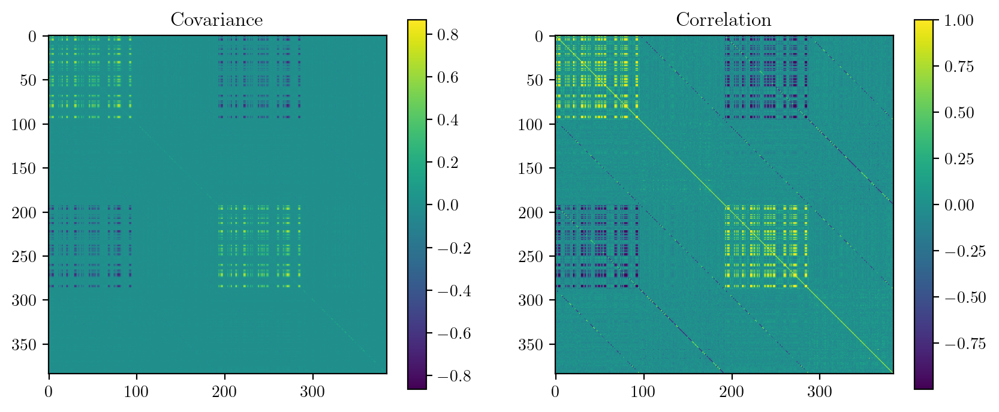

True


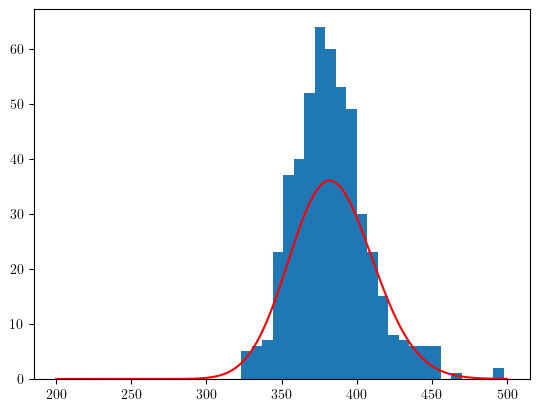

(False, False, True, True)


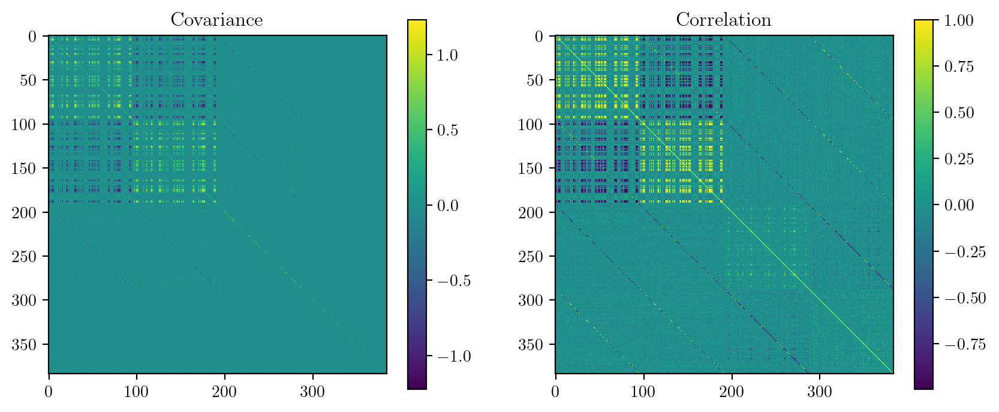

True


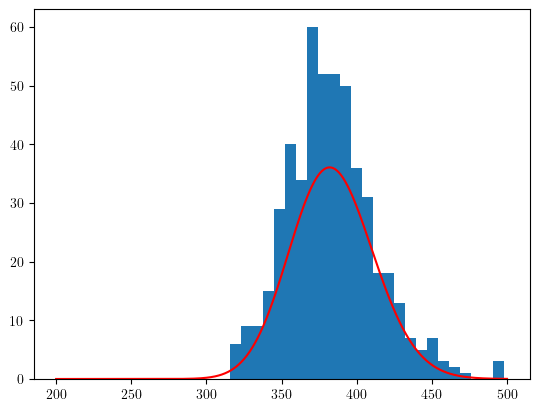

(True, True, True, False)


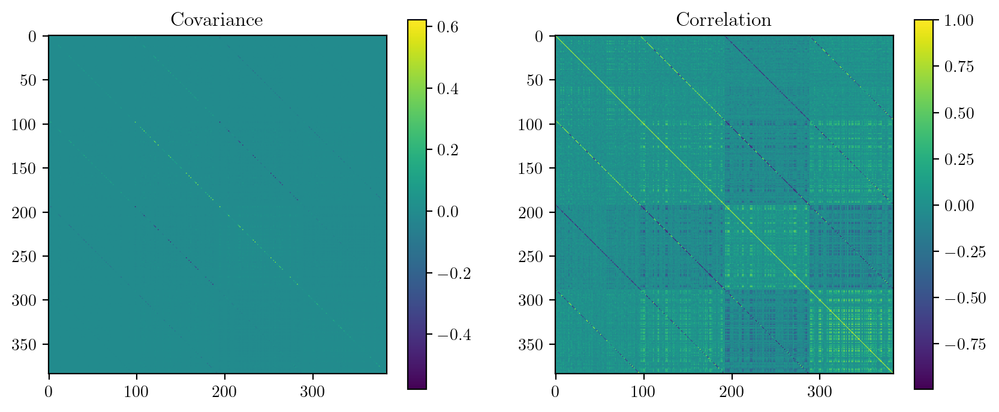

True


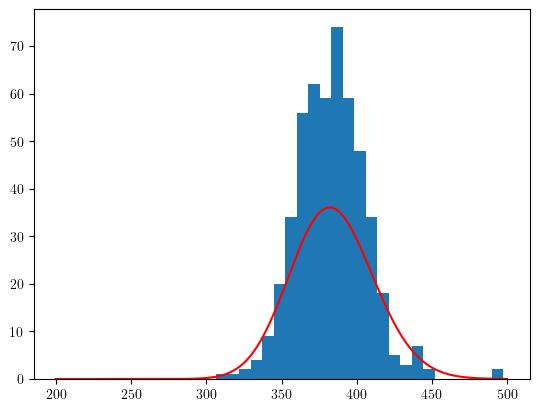

(True, True, False, True)


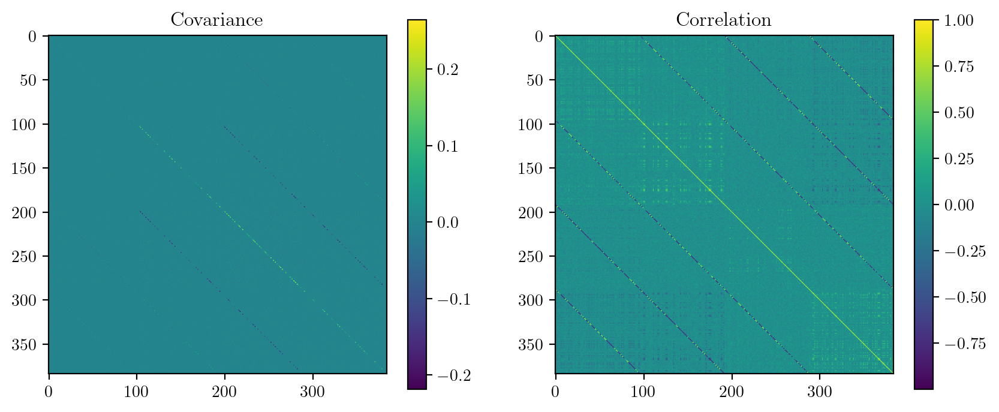

True


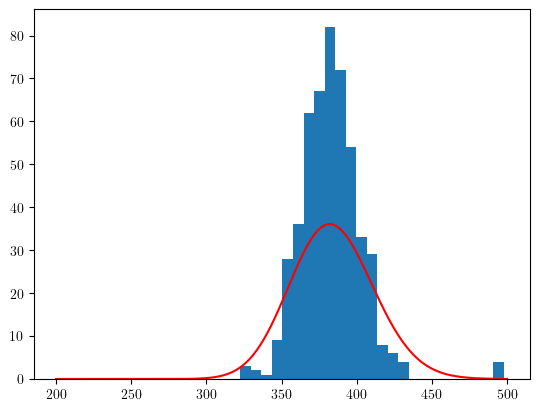

(True, False, True, True)


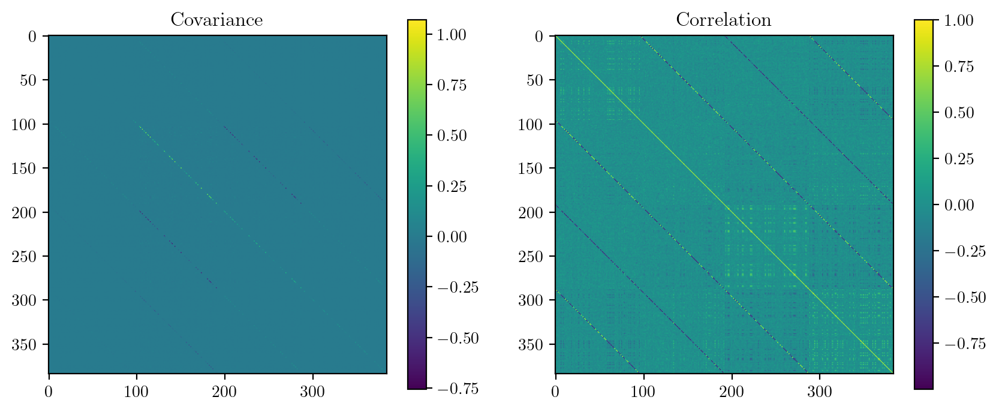

True


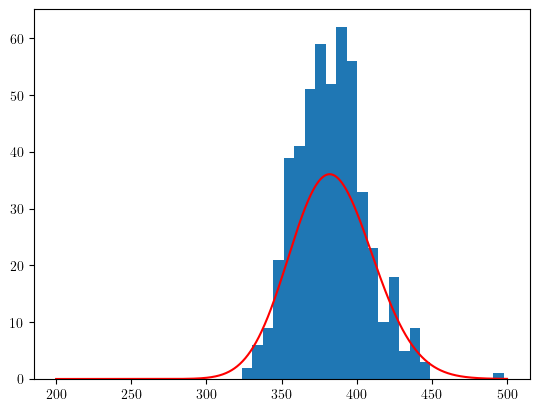

(False, True, True, True)


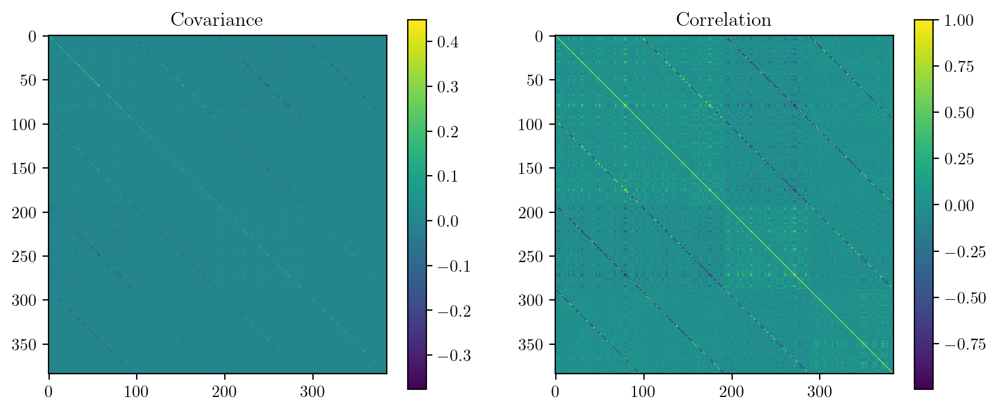

True


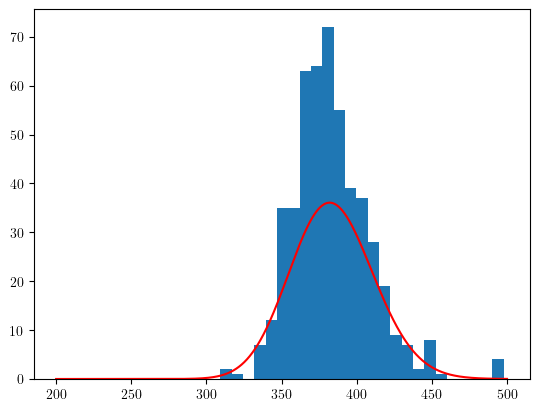

(True, True, True, True)


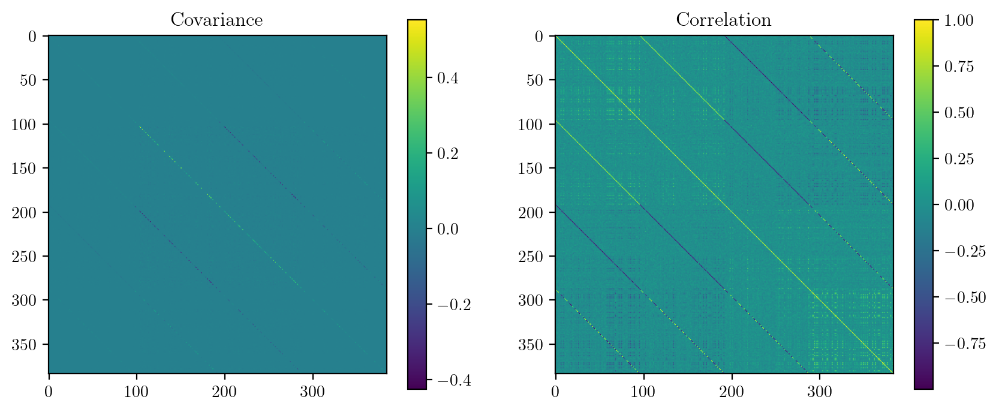

True


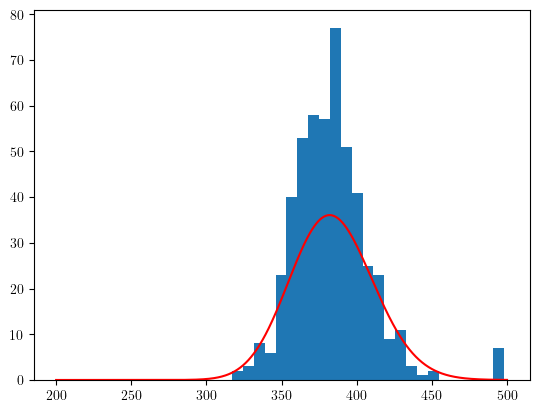

In [105]:
fate_to_plot_args = {}

for fate in fate_to_projs:
    print(fate)
    
    proj = fate_to_projs[fate]

    M = np.array(proj).T  # (384, num_samples)
    corr = np.corrcoef(M)
    cov = np.cov(M)
    dof = M.shape[0]
    
    fig, axs = plt.subplots(1, 2, figsize=(10, 4), dpi=200)
    im = axs[0].imshow(cov)
    fig.colorbar(im, ax=axs[0])
    axs[0].set_title('Covariance')
    
    im = axs[1].imshow(corr)
    fig.colorbar(im, ax=axs[1])
    axs[1].set_title('Correlation')
    
    plt.show()

    cov = cov + np.eye(cov.shape[0]) * 1e-9  # We need to add this to keep cov positive definite
    
    eigvals = np.linalg.eigvals(cov)
    print(np.all(eigvals > 0))
    
    inv_cov = np.linalg.inv(cov)
    mu = np.mean(M, axis=-1)

    x_minus_mu = (M - mu[:, None])  # (384, ns) each column is a zero-mean sample
    
    distances = []
    
    for i in range(x_minus_mu.shape[1]):
        x = x_minus_mu[:, i]
        d_sq = np.dot(x.T, np.matmul(inv_cov, x))
        distances.append(d_sq)
    
    
    # dist_sq = np.diag(np.dot(x_minus_mu.T, np.matmul(inv_cov, x_minus_mu)))  # Shape (100) since we have 100 data observations
    dist_sq = np.array(distances)
    plt.hist(dist_sq, bins=25)
    
    cxs = np.linspace(200, 500, 1000)
    cvs = stats.chi2(dof).pdf(cxs)
    plt.plot(cxs, cvs * 2500, c='red')
    plt.show()

    dist_sq_sorted = np.sort(dist_sq)
    chi_values = stats.chi2.ppf((np.arange(1, len(dist_sq) + 1) - 0.5) / len(dist_sq), dof)

    fate_to_plot_args[fate] = (chi_values, dist_sq_sorted)
    



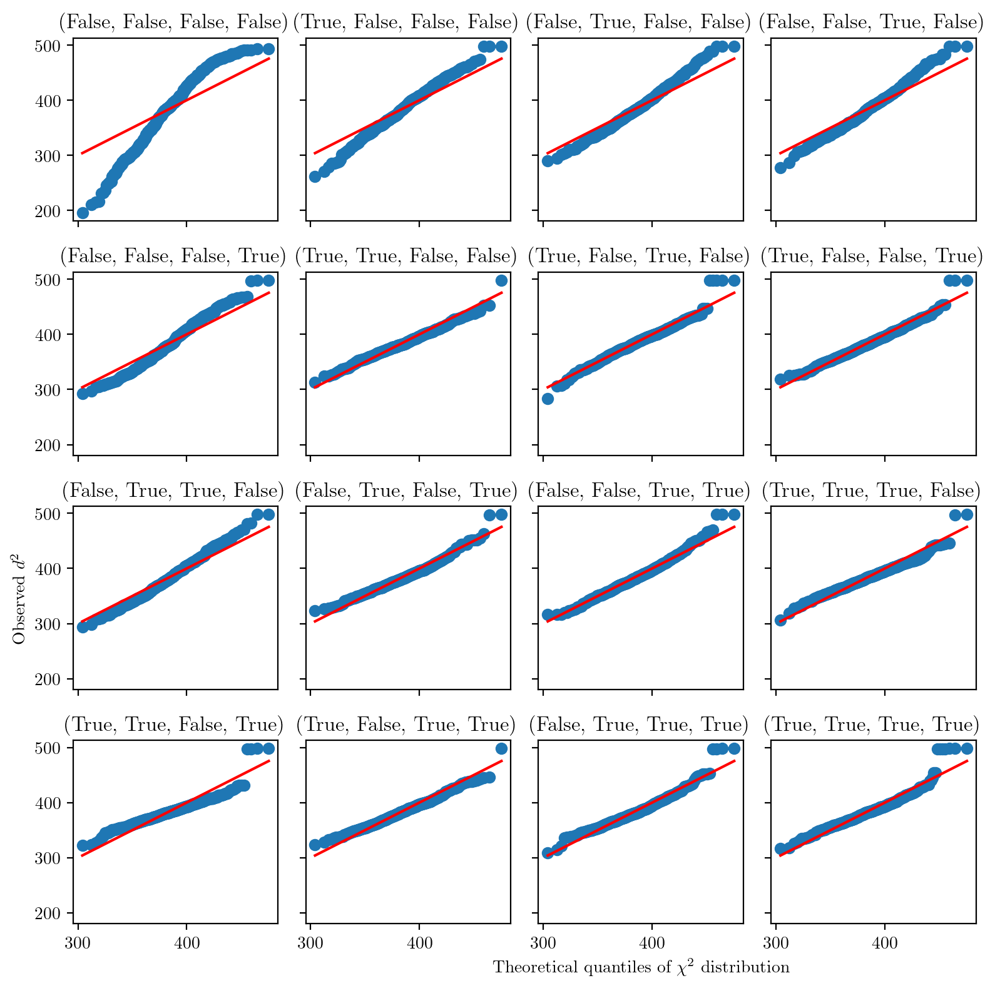

In [108]:
fig, axs = plt.subplots(4, 4, sharex=True, sharey=True, figsize=(8, 8), dpi=200)

for i, k in enumerate(fate_to_plot_args):
    x, y = fate_to_plot_args[k]
    ax = axs.flatten()[i]

    ax.plot(x, y, 'o')
    ax.plot([min(x), max(x)], [min(x), max(x)], 'r-')
    ax.set_title(k)

axs[3, 2].set_xlabel('Theoretical quantiles of $\chi^2$ distribution')
axs[2, 0].set_ylabel('Observed $d^2$')
    
fig.tight_layout()
plt.show()



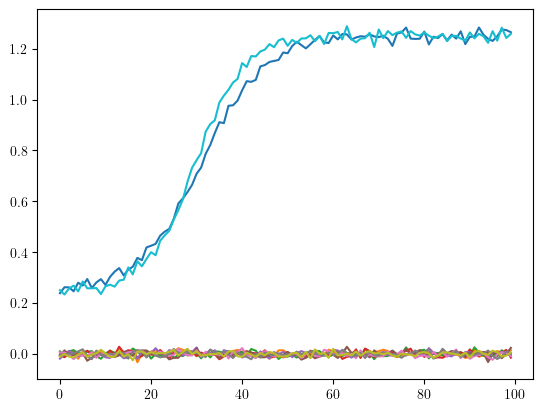

In [178]:
# Define mixture model for sampling pressure traces

def sample_pressure_trace(x):
    phi = high_fidelity_latent_function(x)

    assert 0 <= phi <= 1.0

    ignition = gen.binomial(1, phi) 

    if ignition:
        pressure_trace = model_lf_ignition.predict(x.reshape(-1, 2))[0] + pressure_noise_magnitude * gen.normal(size=100)
    else:
        pressure_trace = pressure_noise_magnitude * gen.normal(size=100)

    return pressure_trace


ps = [sample_pressure_trace(gen.uniform(0, 1, (2,))) for _ in range(10)]
plt.plot(np.array(ps).T)
plt.show()

def sample_C(non_basis_xs):
    pressure_traces = []
    for x in non_basis_xs:
        pressure_traces.append(sample_pressure_trace(x))
    pressure_traces = np.array(pressure_traces)
    assert pressure_traces.shape == (N - k, 100)

    return pressure_traces.T

In [279]:
# Define least squares problem for calculating a particular set of interpolation weights, given a data matrix of basis pressure traces B, and non-basis traces C

def calculate_interpolation_weights(B, C):
    k = 4
    assert B.shape == (100, k)
    assert C.shape == (100, N - k)
    proj_shape = (k, N - k)
    
    def objective_fn(p):
        p = p.reshape(proj_shape)
        f = 0.5 * np.sum((B.dot(p) - C)**2)
        return f
    
    def gradient_fn(p):
        p = p.reshape(proj_shape)
        return B.T.dot(B.dot(p) - C).flatten()

    x0 = np.random.rand(np.prod(proj_shape))
    res = minimize(objective_fn, x0, jac=gradient_fn, method='BFGS', options={'disp': True, 'maxiter': 50})

    assert res.success
    proj_min = res.x

    return proj_min


cs = [sample_C(non_basis_xs) for _ in range(1000)]
p_mins = [calculate_interpolation_weights(B, c) for c in cs]

Optimization terminated successfully.
         Current function value: 0.987334
         Iterations: 15
         Function evaluations: 20
         Gradient evaluations: 20
Optimization terminated successfully.
         Current function value: 1.041150
         Iterations: 10
         Function evaluations: 16
         Gradient evaluations: 16
Optimization terminated successfully.
         Current function value: 0.995418
         Iterations: 15
         Function evaluations: 20
         Gradient evaluations: 20
Optimization terminated successfully.
         Current function value: 0.937081
         Iterations: 13
         Function evaluations: 18
         Gradient evaluations: 18
Optimization terminated successfully.
         Current function value: 0.982800
         Iterations: 13
         Function evaluations: 18
         Gradient evaluations: 18
Optimization terminated successfully.
         Current function value: 0.960245
         Iterations: 12
         Function evaluations: 18
  

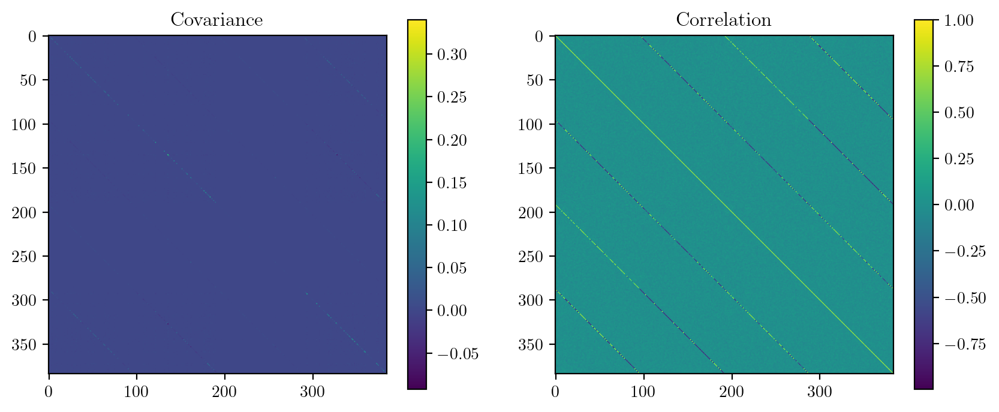

In [280]:
# Get empirical covariance matrix from p_mins vectors

M = np.array(p_mins).T  # (384, 100)
corr = np.corrcoef(M)
cov = np.cov(M)

fig, axs = plt.subplots(1, 2, figsize=(10, 4), dpi=200)
im = axs[0].imshow(cov)
fig.colorbar(im, ax=axs[0])
axs[0].set_title('Covariance')

im = axs[1].imshow(corr)
fig.colorbar(im, ax=axs[1])
axs[1].set_title('Correlation')

plt.show()

True


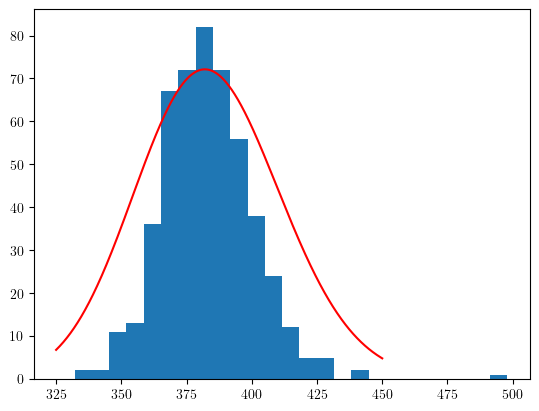

In [292]:
# Let us test if this data follows a multivariate normal distribution, using the empirical mean and covariance in a chi square test

M = np.array(p_mins).T[:, :500] #  data matrix (384, 100)

cov = np.cov(M) 
cov = cov + np.eye(cov.shape[0]) * 1e-12  # We need to add this to keep cov positive definite

eigvals = np.linalg.eigvals(cov)
print(np.all(eigvals > 0))

inv_cov = np.linalg.inv(cov)
mu = np.mean(M, axis=-1)
x_minus_mu = (M - mu[:, None])

distances = []

for i in range(x_minus_mu.shape[1]):
    x = x_minus_mu[:, i]
    d_sq = np.dot(x.T, np.matmul(inv_cov, x))
    distances.append(d_sq)


# dist_sq = np.diag(np.dot(x_minus_mu.T, np.matmul(inv_cov, x_minus_mu)))  # Shape (100) since we have 100 data observations
dist_sq = np.array(distances)
plt.hist(dist_sq, bins=25)

cxs = np.linspace(325, 450, 1000)
cvs = stats.chi2(dof).pdf(cxs)
plt.plot(cxs, cvs * 5000, c='red')
plt.show()

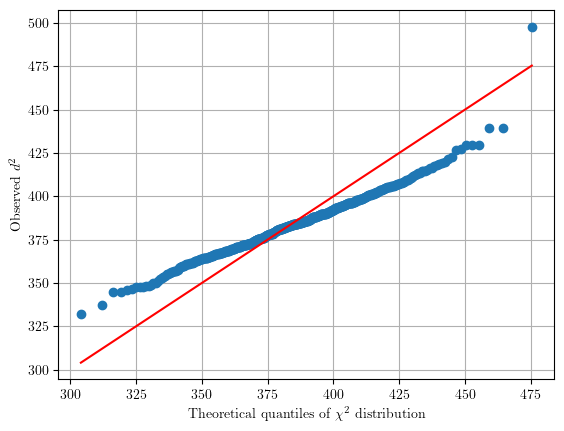

In [296]:
dof = M.shape[0]
dist_sq_sorted = np.sort(dist_sq)
chi_values = stats.chi2.ppf((np.arange(1, len(dist_sq) + 1) - 0.5) / len(dist_sq), dof)

# Now you can plot dist_sq_sorted and chi_values to see if they follow the same distribution
plt.plot(chi_values, dist_sq_sorted, 'o')
plt.plot([min(chi_values), max(chi_values)], [min(chi_values), max(chi_values)], 'r-')
plt.xlabel('Theoretical quantiles of $\chi^2$ distribution')
plt.ylabel('Observed $d^2$')
plt.grid()
plt.show()

In [260]:
# This plot above shows that the values of proj are not multivariate normal- they are tighter around the mean than would be expected from MVN.

384